# NDVI Data Collection and Preprocessing

NDVI stands for Normalized Difference Vegetation Index(NDVI), a key tool in assesing vegetation health. It's a simple numeric indicator that uses satellite imagery to assess whether the observed target (usually vegetation) contains live green vegetation or not. NDVI is calculated from the visible and near-infrared light reflected by vegetation, involves comparing the reflectance of near-infrared (NIR) and red light.

$$ \text{NDVI} = \frac{\text{NIR} - \text{Red}}{\text{NIR} + \text{Red}} $$

**Where**

- $NIR$ is the near-infrared radiation, and
- $Red$ is the visible red radiation.

NDVI plays a critical role in food security by enabling various aspects of agricultural management and prediction. It aids in monitoring crop health and growth stages, facilitating timely interventions to optimize agricultural practices. Moreover, decreases in NDVI serve as early indicators of drought stress, warning of potential crop failures due to water scarcity. NDVI data also correlate with crop yields, providing valuable insights for yield estimation and informing food production forecasts. Additionally, NDVI serves as a foundational input for predictive models assessing crucial food security indicators such as Food Consumption Score (FCS) and Household Dietary Diversity Score (HDDS). Furthermore, by identifying areas with healthy vegetation and those under stress, NDVI guides land use planning, optimizing agricultural land allocation and conservation efforts. Overall, integrating NDVI data into food security assessments enhances our ability to predict, monitor, and address vulnerabilities in food systems, supporting evidence-based decision-making for sustainable development goals.


## About Modis 

**Data Product Citations:**
Didan, K. (2021). MODIS/Terra Vegetation Indices 16-Day L3 Global 250m SIN Grid V061. NASA EOSDIS Land Processes Distributed Active Archive Center. Accessed 2024-05-03 from https://doi.org/10.5067/MODIS/MOD13Q1.061. Accessed May 3, 2024.


**Software Citation:**

AppEEARS Team. (2024). Application for Extracting and Exploring Analysis Ready Samples (AppEEARS). Ver. 3.53. NASA EOSDIS Land Processes Distributed Active Archive Center (LP DAAC), USGS/Earth Resources Observation and Science (EROS) Center, Sioux Falls, South Dakota, USA. Accessed May 3, 2024. https://appeears.earthdatacloud.nasa.gov

[AppEEARS API](https://appeears.earthdatacloud.nasa.gov/api/)

In [1]:
#!pip install eccodes
#!pip install xarray
#!pip install rioxarray
#!pip install netCDF4
#!pip install ecmwflibs
#!pip install geopandas
#!pip install cftime

In [1]:
import rasterio
import pandas as pd
import geopandas as gpd
import xarray as xr
import rioxarray as rx
from scipy.io import netcdf
from netCDF4 import Dataset
from rasterio.warp import calculate_default_transform, reproject, Resampling
import numpy as np
import cftime
import matplotlib.pyplot as plt
import skimage.exposure
import seaborn as sns
import geogif
from IPython.display import Image
import datetime
from datetime import datetime
import requests
import json
import os
import time

## Helper Functions

In [2]:
def list_appeears_products():
    
    '''
    Retrieve and print a list of products available in the AppEEARS API.

    Returns:
        None

    Example:
        list_appeears_products()
    '''
    url = 'https://appeears.earthdatacloud.nasa.gov/api/product'
    response = requests.get(url)
    if response.status_code == 200:
        products = response.json()
        if products:
            for product in products:
                print(f"Product ID: {product['ProductAndVersion']}, Description: {product['Description']}")
        else:
            print("Failed to retrieve product list.")
    else:
        print(f"Failed to list products: {response.status_code}")


In [3]:
def batch_data_fetching(geojson_file, years, product_id, layer_name, dest_dir):
    """
    This function allows to submit tasks and fetch data for a range of years.

    Parameters:
        geojson_file (str): Path to the GeoJSON file.
        years (range): Range of years.
        product_id (str): Product ID for the data to be fetched.
        layer_name (str): Name of the layer.
        dest_dir (str): Directory where files will be saved.

    Returns:
        None
    """
    for year in range(years[0], years[1] + 1):  # Include the end year
        start_date = f"01-01-{year}"
        end_date = f"12-31-{year}"
        
        print("Start Fetching the ndvi data for the year :  ", year)
        
        # Call the function to submit and fetch data for the year
        submit_task_and_fetch_data(geojson_file, start_date, end_date, product_id, layer_name, dest_dir)
        
    print("Data collection for all years completed.")


In [4]:
#list_appeears_products()

In [5]:
def netcdf_to_dataframe(netcdf_file):
    
    '''
    Reads a netCDF file and converts its contents into a DataFrame.

    Parameters:
        netcdf_file (str): Path to the netCDF file.

    Returns:
        pandas.DataFrame: DataFrame containing the data from the netCDF file.
                          Each column represents a variable, and each row represents a time step.
    '''
    try:
        # Open the netCDF file using xarray
        ds = xr.open_dataset(netcdf_file,engine="netcdf4")

        # Convert the dataset to a pandas DataFrame
        df = ds.to_dataframe()

        return df

    except Exception as e:
        print("An error occurred:", str(e))
        return None


In [6]:
def convert_cftime_to_datetime64(cftime_dates):
    """ Convert an array of cftime dates to numpy datetime64."""
    return np.array([pd.Timestamp(str(date)) for date in cftime_dates])

In [8]:
def split_nc_file(nc_file, output_dir):
    """
    Splits a yearly NDVI NetCDF file into twelve separate files, each corresponding to one month.
    
    Parameters:
        nc_file (str): Path to the original NetCDF file.
        output_dir (str): Directory to save the split NetCDF files.
    """
    # Load the dataset
    ds = xr.open_dataset(nc_file)
    total_times = len(ds['time'])
    part_size = total_times // 12  # Splitting into twelve parts now

    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    file_paths = []
    for i in range(12):
        start = i * part_size
        # Ensure the last part includes any remainder if the total size is not exactly divisible by 12
        end = (i + 1) * part_size if i < 11 else total_times
        subset = ds.isel(time=slice(start, end))
        part_file = f"{output_dir}/part_{i+1}.nc"
        subset.to_netcdf(part_file)
        file_paths.append(part_file)
    
    ds.close()
    return file_paths


In [9]:
def process_ndvi_data(df):
    """
    Processes a DataFrame to compute the mean NDVI and VI Quality grouped by region or province, district, and date.
    """
    # Check if 'time' is in cftime format and convert
    if isinstance(df.iloc[0]['time'], cftime._cftime.DatetimeJulian):
        df['time'] = convert_cftime_to_datetime64(df['time'])
    else:
        df['time'] = pd.to_datetime(df['time'])

    # Extract year and date (month-day) from 'time'
    df['year'] = df['time'].dt.year
    df['date'] = df['time'].dt.strftime('%m-%d')  # Format as month-day

    # Group by 'province', 'district', 'year', and 'date' and calculate mean
    grouped = df.groupby(['province', 'district', 'year', 'date'])
    result_df = grouped[['_250m_16_days_NDVI', '_250m_16_days_VI_Quality']].mean().reset_index()
    #result_df = grouped[['_500m_16_days_NDVI', '_500m_16_days_VI_Quality']].mean().reset_index()

    # Rename columns to shorter names
    result_df.rename(columns={
        '_250m_16_days_NDVI': 'NDVI',
        '_250m_16_days_VI_Quality': 'VI_Quality'
    }, inplace=True)

    return result_df

In [10]:
def batch_data_extraction(nc_files, shapefile, output_directory):
    
    '''
    Process multiple NetCDF files, extract weather data, compute statistics for each district,
    and save the results to separate CSV files. Then merge all files into a single CSV file.

    Parameters:
        nc_files (list): List of paths to the NetCDF files.
        shapefile (str): Path to the shapefile.
        output_directory (str): Path to the directory where the output CSV files will be saved.
    '''
    # Create the output directory if it doesn't exist
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    # Iterate over each NetCDF file
    for nc_file in nc_files:
        # Extract weather data from the NetCDF file
        ndvi_data = extract_ndvi_data(nc_file, shapefile)

        # Compute district ndvi mean statistics
        district_stats = process_ndvi_data(ndvi_data)

        # Generate output file name based on the year column
        year = district_stats['year'].iloc[1]  # Assuming all rows have the same year

        output_file = os.path.join(output_directory, f"ndvi_{year}.csv")

        # Save the district statistics to CSV
        district_stats.to_csv(output_file, index=False)
        print(f"The NDVI Data for year {year} has been successfully extracted and saved to:", output_file)

In [11]:
def process_ndvi_data(file_paths, output_file_path):
    """
    Compute mean NDVI statistics by grouping by year, region or province, district, and month.

    Args:
        file_paths (list of str): List of file paths to the input CSV files.
        output_file_path (str): File path to save the output CSV file.

    Returns:
        pd.DataFrame: DataFrame containing the computed NDVI statistics.
    """
    try:
        # Initialize an empty list to store dataframes
        all_data = []

        # Loop through each file path
        for file_path in file_paths:
            # Load the data
            data = pd.read_csv(file_path)
            all_data.append(data)

        # Concatenate all dataframes into one
        combined_data = pd.concat(all_data, ignore_index=True)

        # Determine whether to use 'region' or 'province'
        if 'region' in combined_data.columns:
            region_col = 'region'
        elif 'province' in combined_data.columns:
            region_col = 'province'
        else:
            raise ValueError("Neither 'region' nor 'province' column found in the data.")

        # Extract month from the date column
        combined_data['month'] = combined_data['date'].str[:2]

        # Convert month to numeric
        combined_data['month'] = pd.to_numeric(combined_data['month'])

        # Group by year, region/province, district, and month, then compute the mean NDVI
        grouped = combined_data.groupby(['year', region_col, 'district', 'month'])['NDVI'].mean().reset_index()

        # Pivot the table to have months as columns
        pivoted = grouped.pivot_table(index=['year', region_col, 'district'], columns='month', values='NDVI').reset_index()

        # Rename columns to match the desired format
        pivoted.columns = ['year', region_col, 'district'] + [f'ndvi_{str(month).zfill(2)}' for month in pivoted.columns[3:]]

        # Save the result to the specified output file path
        pivoted.to_csv(output_file_path, index=False)
        
        print(f"The NDVI data has been successfully saved at {output_file_path}")

        return pivoted

    except Exception as e:
        print(f"An error occurred: {e}")


## Visualization Functions

In [12]:
import xarray as xr
import imageio
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image, display  # For displaying GIFs in Jupyter notebooks
from tempfile import NamedTemporaryFile

def create_ndvi_geogif(nc_file_path, output_gif_path=None):
    """
    Creates an animated GIF of NDVI variations from an xarray Dataset loaded from a NetCDF file.

    Parameters:
        nc_file_path (str): Path to the NetCDF file containing NDVI data.
        output_gif_path (str, optional): Path to save the output GIF file. If None, the GIF is displayed.
    """
    # Load the dataset with time decoding turned off initially
    ds = xr.open_dataset(nc_file_path, decode_times=False)

    # Convert time values assuming they are days since '2000-01-01'
    base_date = pd.Timestamp('2000-01-01')
    ds['time'] = pd.to_datetime(ds['time'].values, unit='D', origin=base_date)

    # Hard-coded variable name for NDVI
    #var_name = '_250m_16_days_NDVI' # Rwanda
    var_name = '_500m_16_days_NDVI' #Tanzania

    # Check if the NDVI variable exists in the dataset
    if var_name not in ds.variables:
        raise ValueError(f"{var_name} not found in the dataset")

    # Extract the NDVI DataArray
    ndvi = ds[var_name]

    # Create the frames for the GIF
    frames = []
    for i in range(len(ndvi.time)):
        fig, ax = plt.subplots()
        ndvi.isel(time=i).plot(ax=ax, cmap='RdYlGn')
        ax.set_title(f"NDVI on {pd.to_datetime(ndvi.time.values[i]).strftime('%Y-%m-%d')}")
        
        # Save the frame to a temporary file
        with NamedTemporaryFile(delete=False, suffix='.png') as tmpfile:
            fig.savefig(tmpfile.name)
            frames.append(imageio.imread(tmpfile.name))
        plt.close(fig)

    # Create and save the GIF
    if output_gif_path:
        imageio.mimsave(output_gif_path, frames, fps=1)
        print(f"GIF saved to {output_gif_path}")
    else:
        # Display the GIF inline in Jupyter or similar environment
        with NamedTemporaryFile(delete=False, suffix='.gif') as tmpfile:
            imageio.mimsave(tmpfile.name, frames, fps=1)
            display(Image(filename=tmpfile.name))

In [31]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

def create_ndvi_monthly_subplots(nc_file_path, output_image_path=None):
    """
    Creates subplots for each month of NDVI variations from an xarray Dataset loaded from a NetCDF file.

    Parameters:
        nc_file_path (str): Path to the NetCDF file containing NDVI data.
        output_image_path (str, optional): Path to save the output image file. If None, the image is displayed.
    """
    # Load the dataset with time decoding turned off initially
    ds = xr.open_dataset(nc_file_path, decode_times=False)

    # Convert time values assuming they are days since '2000-01-01'
    base_date = pd.Timestamp('2000-01-01')
    ds['time'] = pd.to_datetime(ds['time'].values, unit='D', origin=base_date)

    # Hard-coded variable name for NDVI
    #var_name = '_500m_16_days_NDVI'  # Tanzania
    var_name = '_250m_16_days_NDVI'  # Rwanda

    # Check if the NDVI variable exists in the dataset
    if var_name not in ds.variables:
        raise ValueError(f"{var_name} not found in the dataset")

    # Extract the NDVI DataArray
    ndvi = ds[var_name]

    # Create a 3x4 grid of subplots for each month
    fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 15), sharex=True, sharey=True)
    axes = axes.flatten()

    # Month names for titles
    month_names = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", 
                   "November", "December"]

    # Variable to track if any images were created
    image_created = False

    for month in range(1, 13):
        ax = axes[month - 1]
        month_data = ndvi.sel(time=ndvi['time.month'] == month).mean(dim='time')
        img = month_data.plot(ax=ax, cmap='RdYlGn', add_colorbar=False)
        ax.set_title(f"NDVI for {month_names[month - 1]}")
        if img:
            image_created = True

    # Add a single colorbar for all subplots if any image was created
    if image_created:
        cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
        fig.colorbar(img, cax=cbar_ax, label='NDVI')

    # Add an overall title
    #plt.suptitle('NDVI Data of Tanzania in 2021', fontsize=20)
    plt.suptitle('NDVI Data of Rwanda in 2021', fontsize=20)

    plt.tight_layout(rect=[0, 0, 0.9, 0.96])

    # Save or display the figure
    if output_image_path:
        plt.savefig(output_image_path)
        print(f"Image saved to {output_image_path}")
    else:
        plt.show()


## Fetch ndvi Data From AppEEARS

In [14]:
def submit_task_and_fetch_data(geojson_file, start_date, end_date, product_id, layer_name, dest_dir):
    """
    Submit a task to fetch data using AppEEARS API and save the downloaded files in a directory based on the year.

    Args:
        geojson_file (str): Path to the GeoJSON file.
        start_date (str): Start date in MM-DD-YYYY format.
        end_date (str): End date in MM-DD-YYYY format.
        product_id (str): Product ID for the data to be fetched.
        layer_name (str): Name of the layer.
        dest_dir (str): Directory where files will be saved.

    Returns:
        None

    Example:
        submit_task_and_fetch_data('path/to/geojson_file.geojson', '01-01-2024', '12-31-2024', 'product_id', 'layer_name', 'destination_directory')
    """
    # Authenticate
    auth_url = 'https://appeears.earthdatacloud.nasa.gov/api/login'
    credentials = ('YourUsername', 'YourPassword')  # Use environment variables in production
    response = requests.post(auth_url, auth=credentials)
    if response.status_code != 200:
        print("Authentication failed.")
        return
    token = response.json()['token']

    # Read the GeoJSON file
    with open(geojson_file, 'r') as file:
        geojson = json.load(file)

    # Define the URL for submitting a task
    task_url = 'https://appeears.earthdatacloud.nasa.gov/api/task'
    headers = {'Authorization': f'Bearer {token}', 'Content-Type': 'application/json'}
    task_params = {
        "task_type": "area",
        "task_name": "NDVI Data Extraction",
        "params": {
            "dates": [
                {
                    "startDate": start_date,
                    "endDate": end_date,
                    "recurring": False
                }
            ],
            "layers": [
                {
                    "product": product_id,
                    "layer": layer_name
                }
            ],
            "output": {
                "format": {
                    "type": "netcdf4"
                },
                "projection": "geographic"
            },
            "geo": geojson
        }
    }

    # Submit the task
    task_response = requests.post(task_url, headers=headers, json=task_params)
    task_id = task_response.json()['task_id']
    print(f"Task submitted, ID: {task_id}")

    # Check task status until it is done
    while True:
        time.sleep(50)  # Wait for 50 seconds before checking again
        status_response = requests.get(f'{task_url}/{task_id}', headers=headers)
        task_status = status_response.json()['status']
        print(f"Current task status: {task_status}")
        if task_status == 'done':
            print("Task completed. Proceeding to fetch file list.")
            break
        elif task_status in ['error', 'failed']:
            print("Task failed.")
            return

    # Fetch the bundle to get file IDs
    bundle_url = f'https://appeears.earthdatacloud.nasa.gov/api/bundle/{task_id}'
    bundle_response = requests.get(bundle_url, headers={'Authorization': f'Bearer {token}'})
    if bundle_response.status_code == 200:
        files = bundle_response.json()['files']
        # Get the year from start_date
        year = datetime.strptime(start_date, '%m-%d-%Y').year
        year_dir = os.path.join(dest_dir, str(year))
        os.makedirs(year_dir, exist_ok=True)
        for file in files:
            file_id = file['file_id']
            file_name = file['file_name']
            file_download_url = f'https://appeears.earthdatacloud.nasa.gov/api/bundle/{task_id}/{file_id}'
            download_response = requests.get(file_download_url, headers={'Authorization': f'Bearer {token}'}, stream=True)

            if download_response.status_code == 200:
                # Prefix the file name with the year
                year_prefixed_file_name = f"{year}_{file_name}"
                filepath = os.path.join(year_dir, year_prefixed_file_name)
                with open(filepath, 'wb') as f:
                    for chunk in download_response.iter_content(chunk_size=8192):
                        f.write(chunk)
                print(f"Data downloaded successfully and saved to {filepath}")
            else:
                print(f"Failed to download file {file_name}: {download_response.status_code}, {download_response.text}")
    else:
        print(f"Failed to fetch file list: {bundle_response.status_code}, {bundle_response.text}")


## Extract the Data As Whole Dataset

In [15]:
def extract_ndvi_data(nc_file, shapefile):
    """
    Extracts NDVI data from a NetCDF file for each geometry in a shapefile, excluding rows with null NDVI values.

    Parameters:
        nc_file (str): Path to the NetCDF file.
        shapefile (str): Path to the shapefile.

    Returns:
        pandas.DataFrame: DataFrame containing extracted NDVI data, excluding null NDVI values.
    """
    # Load the NetCDF file with xarray
    ds = xr.open_dataset(nc_file)
    ds.rio.set_spatial_dims(x_dim="lon", y_dim="lat", inplace=True)

    # Manually set the CRS if not defined
    if ds.rio.crs is None:
        ds.rio.write_crs("epsg:4326", inplace=True)

    # Load the shapefile with GeoPandas
    gdf = gpd.read_file(shapefile)

    # Convert GeoDataFrame CRS to match Dataset CRS
    if gdf.crs != ds.rio.crs:
        gdf = gdf.to_crs(ds.rio.crs)

    results = []

    # Determine the column name for administrative regions dynamically
    region_column_name = None
    for column_name in ['region', 'province']:
        if column_name in gdf.columns:
            region_column_name = column_name
            break

    # Loop through each geometry in the GeoDataFrame
    for idx, row in gdf.iterrows():
        geometry = row.geometry

        # Clip the dataset by the geometry
        clipped = ds.rio.clip([geometry], gdf.crs, drop=True, all_touched=True)

        # Process each clipped dataset
        if 'time' in clipped.dims:
            # Convert to DataFrame
            df = clipped.to_dataframe().reset_index()
            
            # Filter out rows where '_250m_16_days_NDVI' is null
            
            if '_250m_16_days_NDVI' in df.columns:
                df = df.dropna(subset=['_250m_16_days_NDVI'])
            
            '''
            # Filter out rows where '_500m_16_days_NDVI' is null
            if '_500m_16_days_NDVI' in df.columns:
                df = df.dropna(subset=['_500m_16_days_NDVI'])
            '''
            # Continue only if there are remaining rows after filtering
            if not df.empty:
                # Add region or province column
                if region_column_name:
                    df[region_column_name] = row[region_column_name]
                    df['district'] = row['district']  # assuming 'district' column always exists
                    results.append(df)
                else:
                    print("No administrative region column found in the shapefile. Skipping...")
            else:
                print(f"No NDVI data for geometry at index {idx}. Skipping...")

        else:
            print(f"No data for geometry at index {idx} in the dataset.")

    # Combine all dataframes into a single DataFrame
    if results:
        result_df = pd.concat(results, ignore_index=True)
    else:
        result_df = pd.DataFrame()  # Return an empty DataFrame if no results

    return result_df


## Download Tanzania Data

In [16]:
# Example usage
geojson_file = 'tanzania_data/shapefiles/tz_country.geojson'
years = (2009, 2023)
#start_date = '01-01-2008'
#end_date   = '12-31-2008'
#product_id = 'MOD13Q1.061' # 250m resolution product
#layer_name = '_250m_16_days_NDVI' # 250m resolution layer

product_id = 'MOD13A1.061' # 500m resolution product
layer_name = '_500m_16_days_NDVI' # 500m resolution layer

dest_dir = "tanzania_data/ndvi_data/"
#submit_task_and_fetch_data(geojson_file, start_date, end_date, product_id, layer_name, dest_dir)
#batch_data_fetching(geojson_file,years,product_id,layer_name,dest_dir)

## Extra Data for each Districts

In [17]:
tz_dir = 'tanzania_data/ndvi_data/'
#nc_2008 = tz_dir+ '2008/2008_MOD13A1.061_500m_aid0001.nc'
nc_2009 = tz_dir+ '2009/2009_MOD13A1.061_500m_aid0001.nc'
nc_2010 = tz_dir+ '2010/2010_MOD13A1.061_500m_aid0001.nc'
nc_2011 = tz_dir+ '2011/2011_MOD13A1.061_500m_aid0001.nc'
nc_2012 = tz_dir+ '2012/2012_MOD13A1.061_500m_aid0001.nc'
nc_2013 = tz_dir+ '2013/2013_MOD13A1.061_500m_aid0001.nc'
nc_2014 = tz_dir+ '2014/2014_MOD13A1.061_500m_aid0001.nc'
nc_2015 = tz_dir+ '2015/2015_MOD13A1.061_500m_aid0001.nc'
nc_2016 = tz_dir+ '2016/2016_MOD13A1.061_500m_aid0001.nc'
nc_2017 = tz_dir+ '2017/2017_MOD13A1.061_500m_aid0001.nc'
nc_2018 = tz_dir+ '2018/2018_MOD13A1.061_500m_aid0001.nc'
nc_2019 = tz_dir+ '2019/2019_MOD13A1.061_500m_aid0001.nc'
nc_2020 = tz_dir+ '2020/2020_MOD13A1.061_500m_aid0001.nc'
nc_2021 = tz_dir+ '2021/2021_MOD13A1.061_500m_aid0001.nc'
nc_2022 = tz_dir+ '2022/2022_MOD13A1.061_500m_aid0001.nc'
nc_2023 = tz_dir+ '2023/2023_MOD13A1.061_500m_aid0001.nc'
nc_files = [nc_2016, nc_2017, nc_2018, nc_2019, nc_2020, nc_2021, nc_2022, nc_2023]
shapefile = 'tanzania_data/shapefiles/tz_districts.shp'
output_directory = tz_dir + 'processed/'
#batch_data_extraction(nc_files, shapefile, output_directory)

C:\Users\ashas\AppData\Local\Temp\ipykernel_9968\2111942101.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.96])


Image saved to conjunctural_graph/tz_nvi_data.png


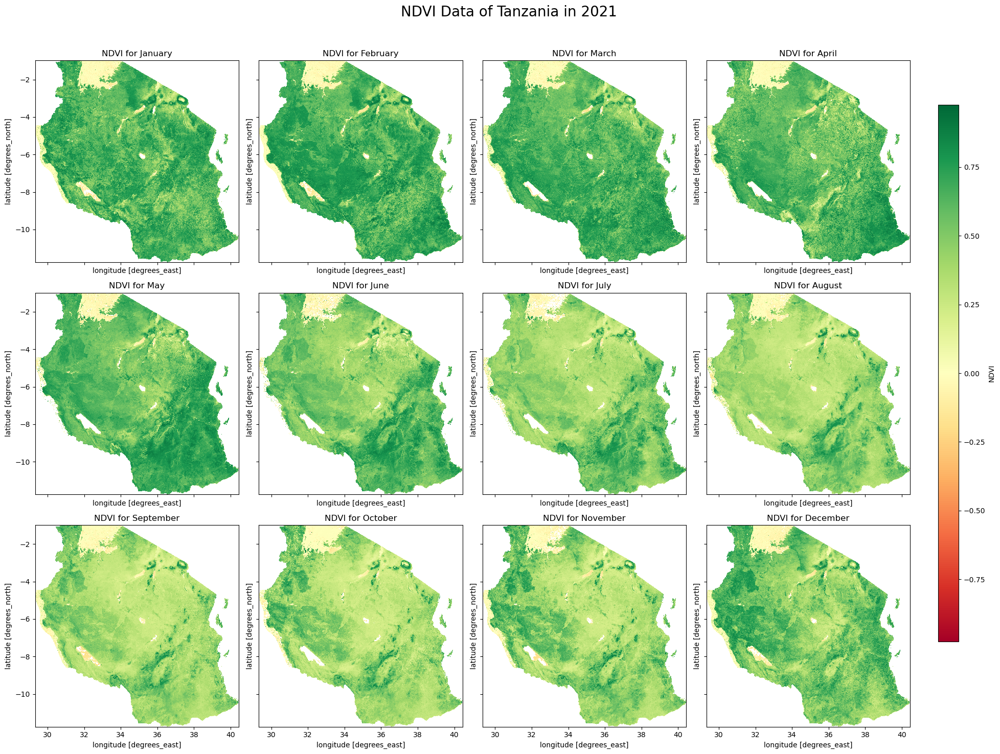

In [25]:
output_image_path = 'conjunctural_graph/tz_nvi_data.png'
create_ndvi_monthly_subplots(nc_2021, output_image_path)

C:\Users\ashas\AppData\Local\Temp\ipykernel_5896\570873448.py:44: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames.append(imageio.imread(tmpfile.name))


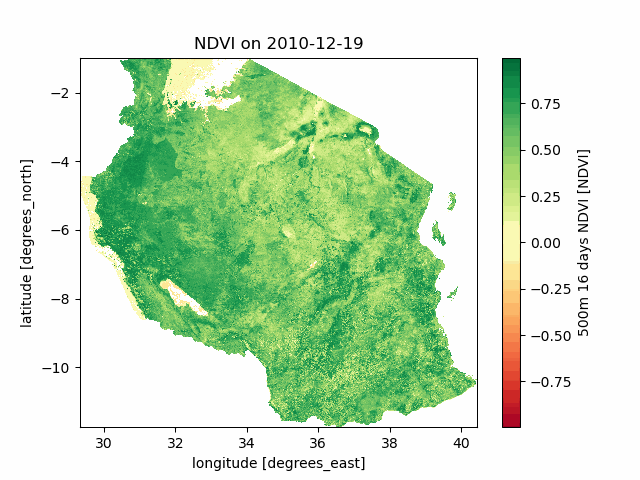

In [40]:
create_ndvi_geogif(nc_2011)

In [41]:
create_ndvi_geogif(nc_2011,output_directory+'ndvi.gif')

C:\Users\ashas\AppData\Local\Temp\ipykernel_5896\570873448.py:44: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames.append(imageio.imread(tmpfile.name))


GIF saved to tanzania_data/ndvi_data/processed/ndvi.gif


In [18]:
df = pd.read_csv('tanzania_data/ndvi_data/processed/ndvi_2023.csv', delimiter = ',')

In [19]:
df.tail()

,region,district,year,date,NDVI,VI_Quality
4435,Tanga,Tanga,2023,10-16,0.593749,6833.893521
4436,Tanga,Tanga,2023,11-01,0.565007,7177.000321
4437,Tanga,Tanga,2023,11-17,0.710040,4246.743377
4438,Tanga,Tanga,2023,12-03,0.740884,3487.930946
4439,Tanga,Tanga,2023,12-19,0.715521,4403.707474


### Final Processing of ndvi data

In [24]:
output_path = 'tanzania_data/ndvi_data/processed/tz_ndvi_data.csv'
f1 = 'tanzania_data/ndvi_data/processed/ndvi_2009.csv'
f2 = 'tanzania_data/ndvi_data/processed/ndvi_2010.csv'
f3 = 'tanzania_data/ndvi_data/processed/ndvi_2011.csv'
f4 = 'tanzania_data/ndvi_data/processed/ndvi_2012.csv'
f5 = 'tanzania_data/ndvi_data/processed/ndvi_2013.csv'
f6 = 'tanzania_data/ndvi_data/processed/ndvi_2014.csv'
f7 = 'tanzania_data/ndvi_data/processed/ndvi_2015.csv'
f8 = 'tanzania_data/ndvi_data/processed/ndvi_2016.csv'
f9 = 'tanzania_data/ndvi_data/processed/ndvi_2017.csv'
f10 = 'tanzania_data/ndvi_data/processed/ndvi_2018.csv'
f11 = 'tanzania_data/ndvi_data/processed/ndvi_2019.csv'
f12 = 'tanzania_data/ndvi_data/processed/ndvi_2020.csv'
f13 = 'tanzania_data/ndvi_data/processed/ndvi_2021.csv'
f14 = 'tanzania_data/ndvi_data/processed/ndvi_2022.csv'
f15 = 'tanzania_data/ndvi_data/processed/ndvi_2023.csv'
files = [f1, f2, f3, f4, f5, f6, f7, f8, f9, f10, f11, f12, f13, f14, f15]
#process_ndvi_data(files,output_path)

## Rwanda Data Download

In [42]:
# Example usage
geojson_file = 'rwanda_data/shapefiles/rw_country.geojson'
#years = (2012, 2021)
start_date = '01-01-2014'
end_date   = '12-31-2014'
product_id = 'MOD13Q1.061'
layer_name = '_250m_16_days_NDVI'
dest_dir = "rwanda_data/ndvi_data/"
#submit_task_and_fetch_data(geojson_file, start_date, end_date, product_id, layer_name, dest_dir)
#batch_data_fetching(geojson_file,years,product_id,layer_name,dest_dir)

## Extra Data for each Districts

In [35]:
rw_dir = 'rwanda_data/ndvi_data/'
nc_2005 = rw_dir+ '2005/2005_MOD13Q1.061_250m_aid0001.nc'
nc_2011 = rw_dir+ '2011/2011_MOD13Q1.061_250m_aid0001.nc'
nc_2014 = rw_dir+ '2014/2014_MOD13Q1.061_250m_aid0001.nc'
nc_2017 = rw_dir+ '2017/2017_MOD13Q1.061_250m_aid0001.nc'
nc_2020 = rw_dir+ '2020/2020_MOD13Q1.061_250m_aid0001.nc'
nc_2021= rw_dir+ '2021/2021_MOD13Q1.061_250m_aid0001.nc'
nc_files = [nc_2014]
shapefile = 'rwanda_data/shapefiles/rw_district.shp'
output_directory = rw_dir + 'processed/'

In [36]:
#batch_data_extraction(nc_files, shapefile, output_directory)

C:\Users\ashas\AppData\Local\Temp\ipykernel_9968\572300672.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.96])


Image saved to conjunctural_graph/rw_ndvi_data2.png


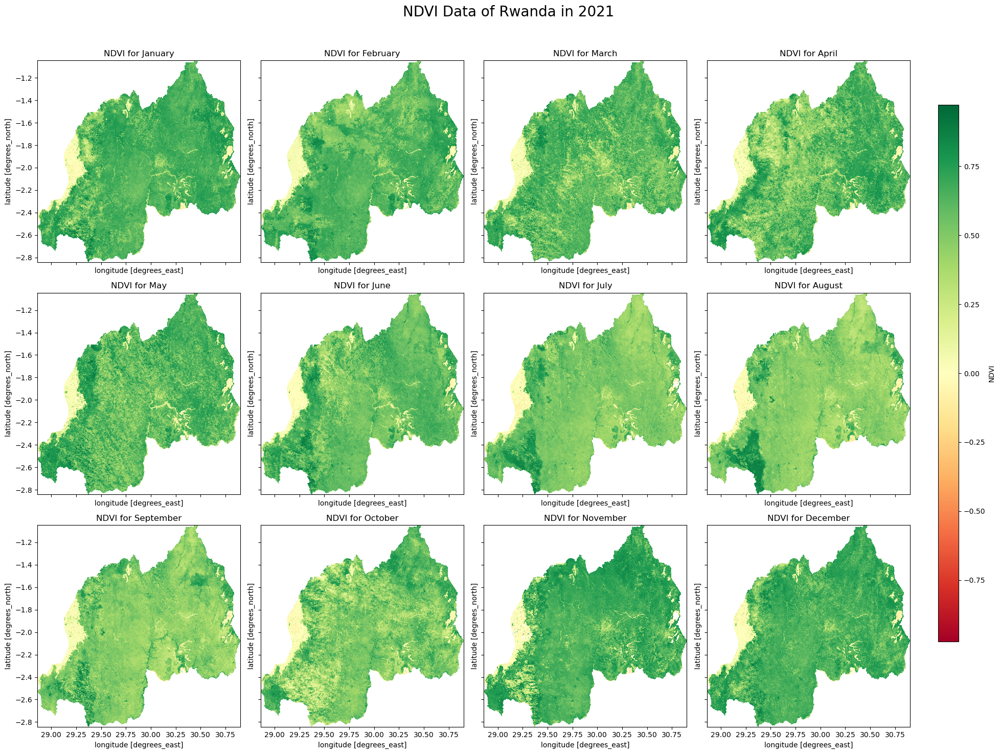

In [37]:
output_image_path = 'conjunctural_graph/rw_ndvi_data2.png'
create_ndvi_monthly_subplots(nc_2020, output_image_path)

C:\Users\ashas\AppData\Local\Temp\ipykernel_5896\128601304.py:44: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames.append(imageio.imread(tmpfile.name))


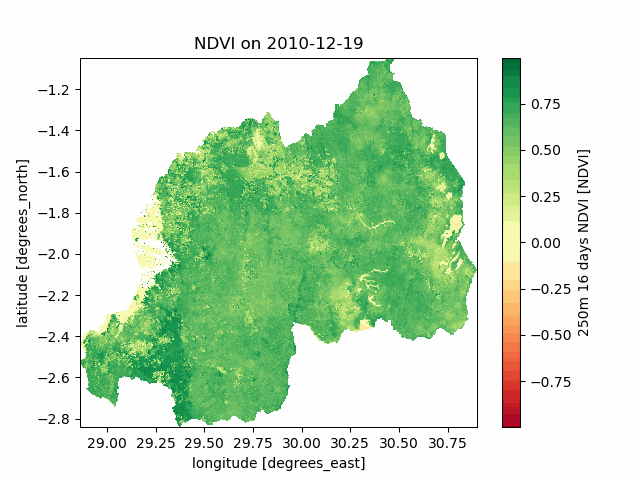

In [37]:
create_ndvi_geogif(nc_2011)

In [36]:
create_ndvi_geogif(nc_2011,output_directory+'ndvi.gif')

C:\Users\ashas\AppData\Local\Temp\ipykernel_5896\128601304.py:44: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames.append(imageio.imread(tmpfile.name))


GIF saved to rwanda_data/ndvi_data/processed/ndvi.gif


In [90]:
df = pd.read_csv('rwanda_data/ndvi_data/processed/ndvi_2006.csv', delimiter = ',')

In [91]:
df.head()

,province,district,year,date,NDVI,VI_Quality
0,Amajyaruguru,Burera,2005,12-19,0.434430,9949.981146
1,Amajyaruguru,Burera,2006,01-01,0.373703,8616.219062
2,Amajyaruguru,Burera,2006,01-17,0.518290,2877.326568
3,Amajyaruguru,Burera,2006,02-02,0.465203,3139.811856
4,Amajyaruguru,Burera,2006,02-18,0.503937,4595.015340


### Final Processing of ndvi data

In [29]:
output_path = 'rwanda_data/ndvi_data/processed/rw_ndvi_data.csv'
f1 = 'rwanda_data/ndvi_data/processed/ndvi_2005.csv'
f2 = 'rwanda_data/ndvi_data/processed/ndvi_2006.csv'
f3 = 'rwanda_data/ndvi_data/processed/ndvi_2011.csv'
f4 = 'rwanda_data/ndvi_data/processed/ndvi_2012.csv'
f5 = 'rwanda_data/ndvi_data/processed/ndvi_2014.csv'
f6 = 'rwanda_data/ndvi_data/processed/ndvi_2015.csv'
f7 = 'rwanda_data/ndvi_data/processed/ndvi_2017.csv'
f8 = 'rwanda_data/ndvi_data/processed/ndvi_2018.csv'
f9 = 'rwanda_data/ndvi_data/processed/ndvi_2020.csv'
f10 = 'rwanda_data/ndvi_data/processed/ndvi_2021.csv'
files = [f1, f2, f3, f4, f5, f6, f7, f8, f9, f10]
#process_ndvi_data(files,output_path)